# Part A: On-chain based ML

## Data

In [41]:
import numpy as np
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [42]:
def load_data(filepath: str) -> dict:
    """Load token data from a pickle file."""
    with open(filepath, 'rb') as f:
        return pickle.load(f)

In [43]:
def analyze_token_data(df: pd.DataFrame) -> None:
    """Print brief analysis of a token's DataFrame."""
    print("Shape:", df.shape)
    print("Columns:", df.columns.tolist())
    print("Data types:\n", df.dtypes)
    if 'daily_active_addresses' in df.columns:
        print("\nSummary for 'Daily_active_addresses':")
        print(df['daily_active_addresses'].describe())
    else:
        print("\nTarget variable 'Daily_active_addresses' not found.")
    print("\nMissing values per column:")
    print(df.isnull().sum())
    print("-" * 40)

In [44]:
def token_data_overview(data: dict) -> pd.DataFrame:
    """
    Create an overview DataFrame with token names and their corresponding number of rows.
    """
    overview = [{'token': token, 'num_rows': df.shape[0]} for token, df in data.items()]
    return pd.DataFrame(overview)

In [ ]:
def plot_top_tokens(overview: pd.DataFrame, top_n: int = 10) -> None:
    """
    Plot a bar chart of the top N tokens by the number of rows (data points).
    """
    top_tokens = overview.sort_values(by='num_rows', ascending=False).head(top_n)
    
    plt.figure(figsize=(10, 6))
    plt.bar(top_tokens['token'], top_tokens['num_rows'], color='skyblue')
    plt.xlabel('Token')
    plt.ylabel('Number of Data Rows')
    plt.title(f'Top {top_n} Tokens with the Most Data Points')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [46]:
data = load_data('san_tokens_PA_data_100.pkl')
for token, df in data.items():
    print(f"Token: {token}")
    analyze_token_data(df)

Token: frax-share
Shape: (1819, 12)
Columns: ['daily_opening_price_usd', 'daily_high_price_usd', 'daily_low_price_usd', 'daily_closing_price_usd', 'daily_trading_volume_usd', 'daily_active_addresses', 'transactions_count', 'transaction_volume', 'transaction_volume_usd', 'volume_usd', 'circulation_1d', 'network_growth']
Data types:
 daily_opening_price_usd     float64
daily_high_price_usd        float64
daily_low_price_usd         float64
daily_closing_price_usd     float64
daily_trading_volume_usd    float64
daily_active_addresses      float64
transactions_count          float64
transaction_volume          float64
transaction_volume_usd      float64
volume_usd                  float64
circulation_1d              float64
network_growth              float64
dtype: object

Summary for 'Daily_active_addresses':
count    1819.000000
mean      232.322705
std       175.959300
min         0.000000
25%       132.000000
50%       240.000000
75%       322.000000
max      3114.000000
Name: daily_a

Interesting results. We have many tokens, each having 12 features: `daily_opening_price_usd`, `daily_high_price_usd`, `daily_low_price_usd`, `daily_closing_price_usd`, `daily_trading_volume_usd`, `daily_active_addresses`, `transactions_count`, `transaction_volume`, `transaction_volume_usd`, `volume_usd`, `circulation_1d`, and `network_growth`. We also notice that depending on a particular crypto, there might be missing values in different columns of a token. The target variable here must be daily_active_addresses.


In [47]:
num_tokens = len(data)
print(f"Total number of tokens: {num_tokens}")

Total number of tokens: 100


In [48]:
overview = token_data_overview(data)

In [49]:
top_100 = overview.sort_values(by='num_rows', ascending=False).head(100)
print("Top 100 tokens by number of data rows:")
top_100

Top 100 tokens by number of data rows:


,token,num_rows
0,frax-share,1819
69,fox-token,1819
66,apecoin-ape,1819
64,wootrade,1819
63,wax,1819
...,...,...
15,layerzero,211
62,gems-vip,204
7,neiro-eth,176
83,puffer,99


So, we have 100 tokens with different amount of observations : from 56 to 1819.

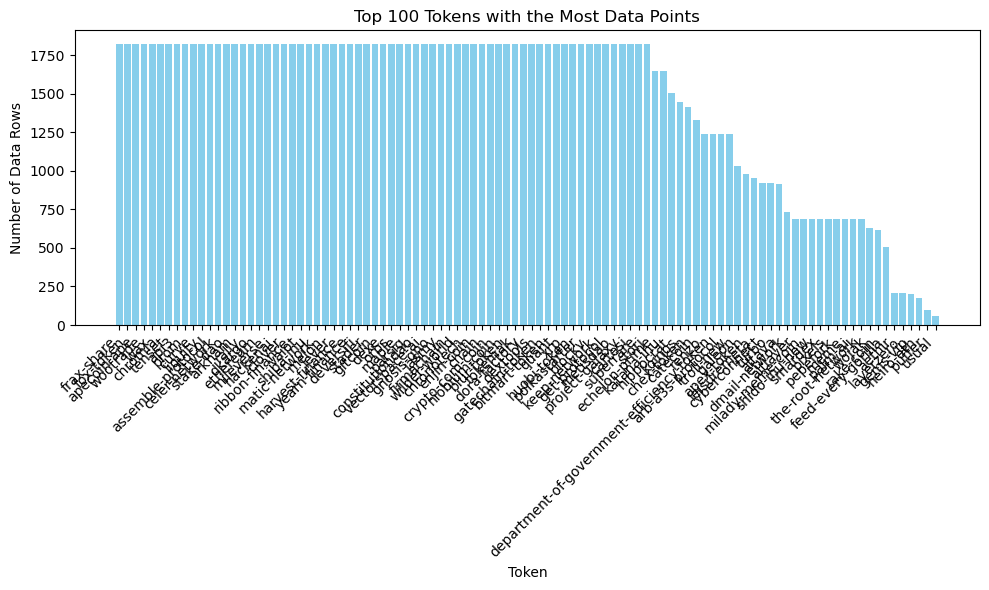

In [50]:
plot_top_tokens(overview, top_n=100)

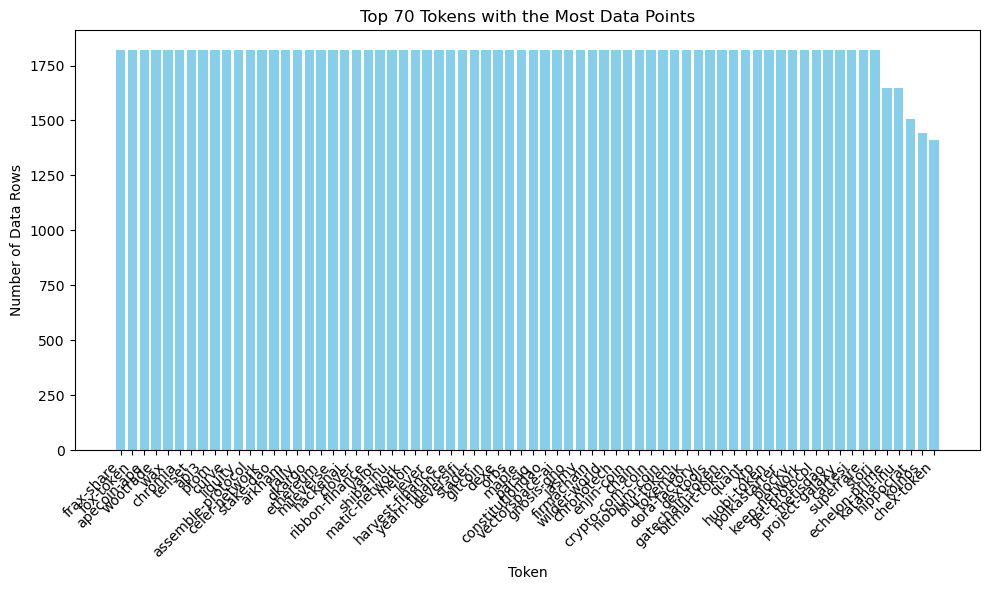

In [51]:
plot_top_tokens(overview, top_n=70)

Around 65 of 100 tokens have exactly 1819 observations, while others have fewer days observed (likely because they were listed later than the other 65).

## ML Model Training, Versioning

In [52]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import mlflow
import mlflow.sklearn

In [53]:
def create_target(df: pd.DataFrame, window: int = 7) -> pd.DataFrame:
    # For day t, target = mean(daily_active_addresses[t+1:t+window+1])
    df = df.copy()
    df['target'] = df['daily_active_addresses'].shift(-1).rolling(window=window).mean()
    return df.dropna(subset=['target'])

### Preprocessing: 7-day rolling average daily_active_addresses target (next 7 days average)

In [54]:
dfs = []
for token, df in data.items():
    df = df.sort_index()
    df = df.fillna(method='ffill').fillna(method='bfill')
    df = create_target(df, window=7)
    df['token'] = token
    dfs.append(df)
full_df = pd.concat(dfs, ignore_index=True)
print("Combined data shape:", full_df.shape)

Combined data shape: (146823, 14)


/var/folders/8_/cdypz21908z67f0vvpr9mdy80000gn/T/ipykernel_52154/4261347246.py:4: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill')
/var/folders/8_/cdypz21908z67f0vvpr9mdy80000gn/T/ipykernel_52154/4261347246.py:4: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill')
/var/folders/8_/cdypz21908z67f0vvpr9mdy80000gn/T/ipykernel_52154/4261347246.py:4: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill')
/var/folders/8_/cdypz21908z67f0vvpr9mdy80000gn/T/ipykernel_52154/4261347246.py:4: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. 

I approach the initial modeling step by training a model on the whole token dataset instead of building separate models for each crypto. I do this because my primary business question is to understand and predict "daily_active_addresses" at a market level, under the hypothesis that tokens exhibit a mutual market trend. By training on the aggregated data, I can more easily compare model performances across multiple loss functions and business metrics, ensuring that I capture the overall market dynamics. I also benefit from a larger volume of data and higher variability, which increases the likelihood that the model learns the underlying trends, tokenomics, and market dynamics inherent in the crypto space. For an MVP, the data lake serves as an experimental playground where I can quickly iterate and validate these hypotheses. Once I identify the best model that captures the overall market trend, I plan to refine the approach by training token-specific models, as I eventually do later in the code.

### Train-Test Split: time-based split per token (80% train, 20% test)


In [55]:
train_dfs, test_dfs = [], []
for token, group in full_df.groupby('token'):
    group = group.sort_index()
    split_idx = int(len(group) * 0.8)
    train_dfs.append(group.iloc[:split_idx])
    test_dfs.append(group.iloc[split_idx:])
train_df = pd.concat(train_dfs, ignore_index=True)
test_df = pd.concat(test_dfs, ignore_index=True)
print("Train shape:", train_df.shape, "Test shape:", test_df.shape)

Train shape: (117412, 14) Test shape: (29411, 14)


In [56]:
# Features: use all columns except target and token identifier.
features = [col for col in train_df.columns if col not in ['target', 'token']]
X_train = train_df[features]
y_train = train_df['target']
X_test = test_df[features]
y_test = test_df['target']

### Models

### Explanation of custom metrics based on the business logic

In my analysis, I use two business metrics—Weighted MAE and Weighted Directional Accuracy—to ensure that model performance is evaluated in a way that aligns with market importance. These metrics incorporate a weight based on network growth, reflecting the idea that errors in predicting highly dynamic tokens have greater business impact.

The **Weighted Mean Absolute Error (Weighted MAE)** is defined as:

$
\text{Weighted MAE} = \frac{1}{N} \sum_{i=1}^{N} \left| y_{\text{pred},i} - y_{\text{true},i} \right| \times \left(1 + \text{network\_growth}_i\right)
$

Here, the absolute error for each prediction is multiplied by a factor of $1 + \text{network\_growth}$, which increases the penalty for errors on tokens that are rapidly growing. This is critical in a market where tokens with significant network growth often drive overall trends and can have outsized business importance.

Similarly, the **Weighted Directional Accuracy** measures the ability of the model to correctly predict the direction of change, weighted by network growth. It is calculated as:

$
\text{Weighted Directional Accuracy} = \frac{\sum_{i=1}^{N} I\big(\text{sign}(y_{\text{pred},i} - \text{current}_i) = \text{sign}(y_{\text{true},i} - \text{current}_i)\big) \times \left(1 + \text{network\_growth}_i\right)}{\sum_{i=1}^{N} \left(1 + \text{network\_growth}_i\right)}
$

In this formula, the indicator function $I(\cdot)$ returns 1 if the predicted and actual changes share the same sign and 0 otherwise. By applying the same weight $1 + \text{network\_growth}$, the metric emphasizes correct trend prediction for tokens with high growth, which is especially valuable when making strategic decisions based on market direction.

Both metrics are designed to capture not just the magnitude of prediction errors but also their relevance to market dynamics. This approach ensures that the evaluation is more sensitive to the tokens that matter most from a business perspective, offering a more nuanced and practically useful measure of model performance.


#### Baseline Model: Linear Regression

In [ ]:
mlflow.set_experiment("onchain_baseline_regression")

with mlflow.start_run():
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    weighted_mae = np.mean(np.abs(y_pred - y_test) * (1 + test_df["network_growth"].values))
    
    # Business metric: weighted directional accuracy
    # Compare predicted vs. actual change relative to current daily_active_addresses
    current_active = test_df["daily_active_addresses"].values
    actual_change = y_test.values - current_active
    predicted_change = y_pred - current_active
    direction_actual = np.sign(actual_change)
    direction_pred = np.sign(predicted_change)
    weighted_direction_accuracy = np.sum((direction_actual == direction_pred).astype(float) * (1 + test_df["network_growth"].values)) / np.sum(1 + test_df["network_growth"].values)
    
    mlflow.log_param("model_type", "LinearRegression")
    mlflow.log_param("target_definition", "7-day rolling avg of next 7 days daily_active_addresses")
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("weighted_mae", weighted_mae)
    mlflow.log_metric("weighted_direction_accuracy", weighted_direction_accuracy)
    
    mlflow.sklearn.log_model(model, "model")
    
    print(f"RMSE: {rmse:.4f}, MAE: {mae:.4f}, Weighted MAE: {weighted_mae:.4f}")
    print(f"Weighted Directional Accuracy: {weighted_direction_accuracy:.4f}")

2025/02/08 13:22:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


RMSE: 53923.5285, MAE: 12097.2338, Weighted MAE: 607639702.7990
Weighted Directional Accuracy: 0.5015


#### Gradient boosting model: LightGBM + Gridsearch

As a competitive model under the MVP ideology, I decide to use gradient boosting models as they are usually near SoTA and not hard to train in the context of tabular data and even time-series data. Thus, we try LightGBM and CatBoost with Gridsearch.

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV

param_grid = {
    'num_leaves': [31, 50],
    'max_depth': [5, 10, -1],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500]
}

lgb_model = lgb.LGBMRegressor(random_state=42)
grid_search = GridSearchCV(lgb_model, param_grid, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
print("Best score (neg MAE):", grid_search.best_score_)

best_lgb_model = grid_search.best_estimator_

Fitting 3 folds for each of 54 candidates, totalling 162 fits


/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, F

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007989 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 78275, number of used features: 12
[LightGBM] [Info] Number of data points in the train set: 78274, number of used features: 12
[LightGBM] [Info] Start training from score 935.289843
[LightGBM] [Info] Start training from score 9300.698243
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 117412, number of used features: 12
[LightGBM] [Info] Start training from score 6262.966759
Best parameters: {'learning_rate': 0.01, 'max_depth': -1, 'n_estimators': 500, 'num_leaves': 50}
Best score (neg MAE): -4634.2096734665565


In [ ]:
with mlflow.start_run():
    # Evaluate on test set
    y_pred_lgb = best_lgb_model.predict(X_test)
    rmse_lgb = np.sqrt(mean_squared_error(y_test, y_pred_lgb))
    mae_lgb = mean_absolute_error(y_test, y_pred_lgb)
    weighted_mae_lgb = np.mean(np.abs(y_pred_lgb - y_test) * (1 + test_df["network_growth"].values))
    
    # Business metric: weighted directional accuracy
    current_active = test_df["daily_active_addresses"].values
    actual_change = y_test.values - current_active
    predicted_change = y_pred_lgb - current_active
    direction_actual = np.sign(actual_change)
    direction_pred = np.sign(predicted_change)
    weighted_direction_accuracy_lgb = np.sum(
        (direction_actual == direction_pred).astype(float) * (1 + test_df["network_growth"].values)
    ) / np.sum(1 + test_df["network_growth"].values)
    
    # Log parameters and metrics
    mlflow.log_param("model_type", "LightGBM")
    mlflow.log_param("grid_search_best_params", grid_search.best_params_)
    mlflow.log_metric("rmse", rmse_lgb)
    mlflow.log_metric("mae", mae_lgb)
    mlflow.log_metric("weighted_mae", weighted_mae_lgb)
    mlflow.log_metric("weighted_direction_accuracy", weighted_direction_accuracy_lgb)
    
    mlflow.lightgbm.log_model(best_lgb_model, "model")
    
    print(f"LightGBM RMSE: {rmse_lgb:.4f}, MAE: {mae_lgb:.4f}, Weighted MAE: {weighted_mae_lgb:.4f}")
    print(f"LightGBM Weighted Directional Accuracy: {weighted_direction_accuracy_lgb:.4f}")


2025/02/08 13:32:00 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


LightGBM RMSE: 3621.2626, MAE: 487.9816, Weighted MAE: 31908960.8061
LightGBM Weighted Directional Accuracy: 0.5619


#### Grid search with time series specific cross validation 

In [ ]:
# LightGBM Grid Search with TimeSeriesSplit

import lightgbm as lgb
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

tscv = TimeSeriesSplit(n_splits=3)
param_grid_lgb = {
    'num_leaves': [31, 50],
    'max_depth': [5, 10, -1],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500]
}
lgb_model = lgb.LGBMRegressor(random_state=42)
grid_search_lgb = GridSearchCV(lgb_model, param_grid_lgb, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)
grid_search_lgb.fit(X_train, y_train)

print("Best parameters (LightGBM):", grid_search_lgb.best_params_)
print("Best score (neg MAE):", grid_search_lgb.best_score_)

best_lgb_model = grid_search_lgb.best_estimator_

Fitting 3 folds for each of 54 candidates, totalling 162 fits


/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, F

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Number of data points in the train set: 29353, number of used features: 12
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 58706, number of used features: 12
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009579 seconds.
You can set `force_row_wise=true` to remove the overhead.


/opt/anaconda3/envs/a_level_1/lib/python3.11/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 117412, number of used features: 12
[LightGBM] [Info] Start training from score 6262.966759
Best parameters (LightGBM): {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500, 'num_leaves': 31}
Best score (neg MAE): -7797.87665633719


In [ ]:
# TimeSeries CV version
with mlflow.start_run():
    y_pred_lgb = best_lgb_model.predict(X_test)
    rmse_lgb = np.sqrt(mean_squared_error(y_test, y_pred_lgb))
    mae_lgb = mean_absolute_error(y_test, y_pred_lgb)
    weighted_mae_lgb = np.mean(np.abs(y_pred_lgb - y_test) * (1 + test_df["network_growth"].values))
    
    # Business metric: weighted directional accuracy
    current_active = test_df["daily_active_addresses"].values
    actual_change = y_test.values - current_active
    predicted_change = y_pred_lgb - current_active
    direction_actual = np.sign(actual_change)
    direction_pred = np.sign(predicted_change)
    weighted_direction_accuracy_lgb = np.sum(
        (direction_actual == direction_pred).astype(float) * (1 + test_df["network_growth"].values)
    ) / np.sum(1 + test_df["network_growth"].values)
    
    mlflow.log_param("model_type", "LightGBM")
    mlflow.log_param("grid_search_best_params", grid_search_lgb.best_params_)
    mlflow.log_metric("rmse", rmse_lgb)
    mlflow.log_metric("mae", mae_lgb)
    mlflow.log_metric("weighted_mae", weighted_mae_lgb)
    mlflow.log_metric("weighted_direction_accuracy", weighted_direction_accuracy_lgb)
    
    mlflow.lightgbm.log_model(best_lgb_model, "model")
    
    print(f"LightGBM RMSE: {rmse_lgb:.4f}, MAE: {mae_lgb:.4f}, Weighted MAE: {weighted_mae_lgb:.4f}")
    print(f"LightGBM Weighted Directional Accuracy: {weighted_direction_accuracy_lgb:.4f}")


2025/02/08 14:15:03 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


LightGBM RMSE: 3541.2706, MAE: 474.6656, Weighted MAE: 30755495.4764
LightGBM Weighted Directional Accuracy: 0.5658


#### Gradient boosting model: CatBoost + GridSearchCV

In [ ]:
import catboost as cb
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

tscv = TimeSeriesSplit(n_splits=3)
param_grid_cb = {
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [100, 300, 500],
    'l2_leaf_reg': [1, 3, 5]
}
cb_model = cb.CatBoostRegressor(random_seed=42, verbose=0)
grid_search_cb = GridSearchCV(cb_model, param_grid_cb, cv=tscv,
                              scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)
grid_search_cb.fit(X_train, y_train)

print("Best parameters for CatBoost:", grid_search_cb.best_params_)
print("Best score (neg MAE) for CatBoost:", grid_search_cb.best_score_)

best_cb_model = grid_search_cb.best_estimator_

Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best parameters for CatBoost: {'depth': 6, 'iterations': 300, 'l2_leaf_reg': 1, 'learning_rate': 0.1}
Best score (neg MAE) for CatBoost: -7820.656126491057


In [ ]:
# %% CatBoost Evaluation and MLflow Logging (including business metric)
with mlflow.start_run():
    y_pred_cb = best_cb_model.predict(X_test)
    rmse_cb = np.sqrt(mean_squared_error(y_test, y_pred_cb))
    mae_cb = mean_absolute_error(y_test, y_pred_cb)
    weighted_mae_cb = np.mean(np.abs(y_pred_cb - y_test) * (1 + test_df["network_growth"].values))
    
    # Business metric: weighted directional accuracy
    current_active = test_df["daily_active_addresses"].values
    actual_change = y_test.values - current_active
    predicted_change = y_pred_cb - current_active
    direction_actual = np.sign(actual_change)
    direction_pred = np.sign(predicted_change)
    weighted_direction_accuracy_cb = np.sum(
        (direction_actual == direction_pred).astype(float) * (1 + test_df["network_growth"].values)
    ) / np.sum(1 + test_df["network_growth"].values)
    
    mlflow.log_param("model_type", "CatBoost")
    mlflow.log_param("grid_search_best_params", grid_search_cb.best_params_)
    mlflow.log_metric("rmse", rmse_cb)
    mlflow.log_metric("mae", mae_cb)
    mlflow.log_metric("weighted_mae", weighted_mae_cb)
    mlflow.log_metric("weighted_direction_accuracy", weighted_direction_accuracy_cb)
    
    mlflow.catboost.log_model(best_cb_model, "model")
    
    print(f"CatBoost RMSE: {rmse_cb:.4f}, MAE: {mae_cb:.4f}, Weighted MAE: {weighted_mae_cb:.4f}")
    print(f"CatBoost Weighted Directional Accuracy: {weighted_direction_accuracy_cb:.4f}")

2025/02/08 14:16:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


CatBoost RMSE: 3738.3425, MAE: 500.2041, Weighted MAE: 32091121.7519
CatBoost Weighted Directional Accuracy: 0.6223


The experiments show that the linear regression baseline performs very poorly compared to tree-based models with grid search hyperparameter tuning. LightGBM with grid search greatly reduces prediction errors, and using time series cross validation further refines its performance. Although CatBoost’s RMSE and MAE are similar to those of LightGBM, its weighted directional accuracy is notably higher, suggesting it better captures the trend direction. The results indicate that tree-based ensemble methods with grid search hyperparameter selection are far more effective for on-chain ML prediction task, with CatBoost offering the best performance in terms of aligning with business-driven metrics.

### Now, we may finally go to the token-specific models by training CatBoost with grid search on validation sets with temporal splits.

In [ ]:
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

tscv = TimeSeriesSplit(n_splits=3)
param_grid_cb = {
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [100, 300, 500],
    'l2_leaf_reg': [1, 3, 5]
}

results = {}
token_predictions = {}  # Store predictions for each token for visualization
for token, df in tqdm(data.items(), total=len(data), desc="Tokens"):
    df = df.sort_index().fillna(method='ffill').fillna(method='bfill')
    df = create_target(df, window=7)
    if len(df) < 50:
        print(f"Skipping token {token} due to insufficient data.")
        continue

    # Train-test split
    split_idx = int(len(df) * 0.8)
    train_df, test_df = df.iloc[:split_idx], df.iloc[split_idx:]
    features = [col for col in train_df.columns if col not in ['target', 'token']]
    X_train, y_train = train_df[features], train_df['target']
    X_test, y_test = test_df[features], test_df['target']
    
    # Remove constant features to avoid CatBoost error
    constant_features = [col for col in X_train.columns if X_train[col].nunique() in [0, 1]]
    if constant_features:
        X_train = X_train.drop(columns=constant_features)
        X_test = X_test.drop(columns=constant_features)
        if X_train.shape[1] == 0:
            print(f"Skipping token {token} because all features are constant.")
            continue
    
    # Grid search with CatBoost and TimeSeriesSplit
    cb_model = cb.CatBoostRegressor(random_seed=42, verbose=0)
    grid_search_cb = GridSearchCV(cb_model, param_grid_cb, cv=tscv, 
                                  scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)
    try:
        grid_search_cb.fit(X_train, y_train)
    except Exception as e:
        print(f"Skipping token {token} due to error during grid search: {e}")
        continue
    best_cb_model = grid_search_cb.best_estimator_
    
    # Predictions and metrics
    y_pred = best_cb_model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    weighted_mae = np.mean(np.abs(y_pred - y_test) * (1 + test_df["network_growth"].values))
    
    current_active = test_df["daily_active_addresses"].values
    actual_change = y_test.values - current_active
    predicted_change = y_pred - current_active
    direction_actual = np.sign(actual_change)
    direction_pred = np.sign(predicted_change)
    weighted_direction_accuracy = np.sum((direction_actual == direction_pred).astype(float) * (1 + test_df["network_growth"].values)) / np.sum(1 + test_df["network_growth"].values)
    
    # Save predictions for later visualization
    token_predictions[token] = {
        'index': test_df.index,
        'y_test': y_test.values,
        'y_pred': y_pred
    }
    
    # MLflow Logging with experiment name as "{token}_cb_gs_tscv"
    mlflow.set_experiment(f"{token}_cb_gs_tscv")
    with mlflow.start_run(run_name=token):
        mlflow.log_param("token", token)
        mlflow.log_param("model_type", "CatBoost")
        mlflow.log_param("best_params", grid_search_cb.best_params_)
        mlflow.log_metric("rmse", rmse)
        mlflow.log_metric("mae", mae)
        mlflow.log_metric("weighted_mae", weighted_mae)
        mlflow.log_metric("weighted_direction_accuracy", weighted_direction_accuracy)
        mlflow.catboost.log_model(best_cb_model, "model")
    
    results[token] = {
        "rmse": rmse,
        "mae": mae,
        "weighted_mae": weighted_mae,
        "weighted_direction_accuracy": weighted_direction_accuracy
    }
    print(f"Token: {token} | RMSE: {rmse:.4f} | MAE: {mae:.4f} | Weighted Direction Accuracy: {weighted_direction_accuracy:.4f}")

In [ ]:
results_df = pd.DataFrame.from_dict(results, orient='index')
print("Aggregated token model performance by custom business metric:")
results_df.sort_values(by='weighted_direction_accuracy', ascending=False)

Aggregated token model performance by custom business metric:


,rmse,mae,weighted_mae,weighted_direction_accuracy
leisuremeta,23.361899,14.456985,279.499453,0.881777
chronotech,5.809644,4.352675,15.370488,0.799231
wax,1.704639,1.462635,1.960975,0.792490
melon,12.310796,9.043119,91.212294,0.768308
dmail-network,2.006660,1.478314,2.724828,0.767176
...,...,...,...,...
turbo,339.698179,231.612392,92812.002709,0.417106
tenset,36.237922,36.071101,77.709466,0.411311
polkastarter,55.108853,31.201373,1916.434903,0.407817
firmachain,44.713598,15.998180,16.413272,0.239075


## Visualization and conclusion

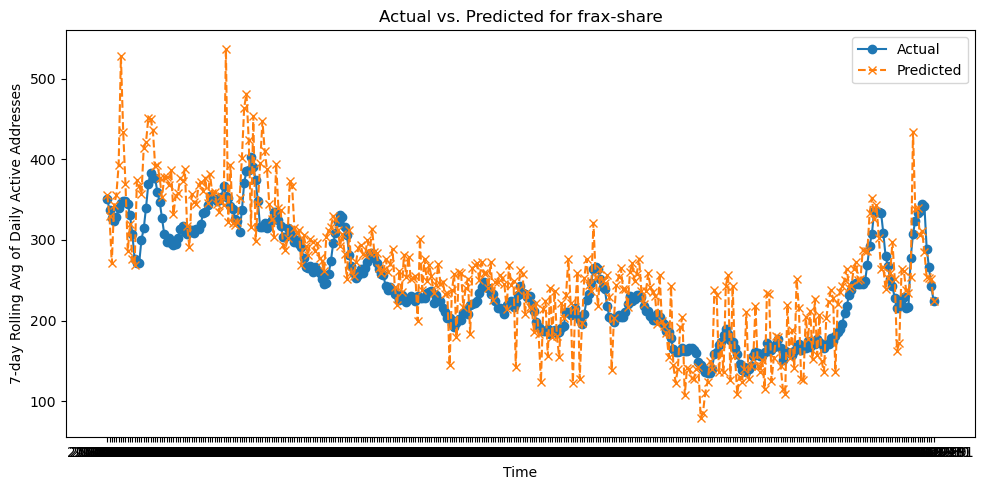

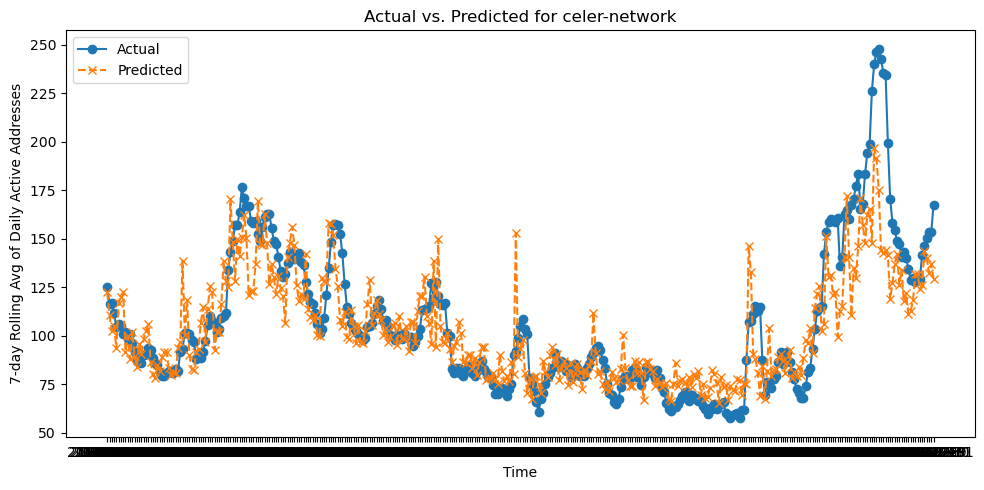

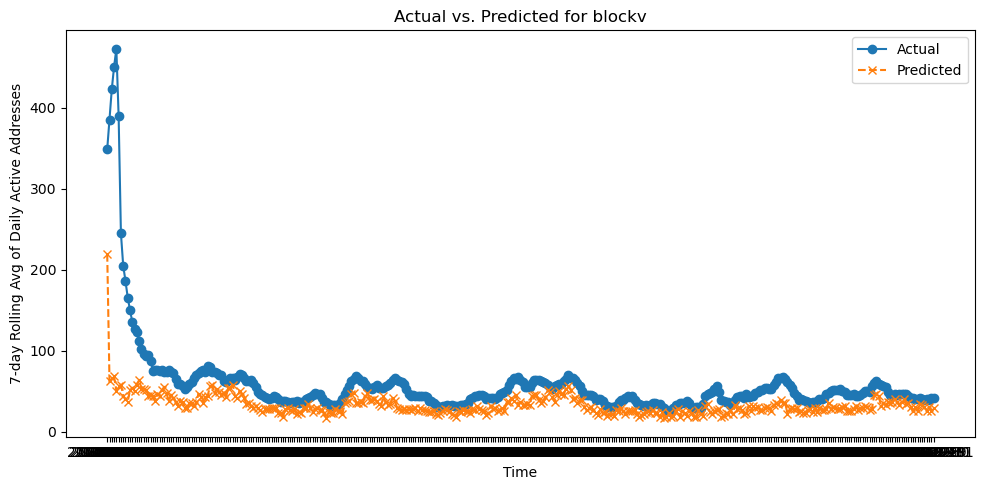

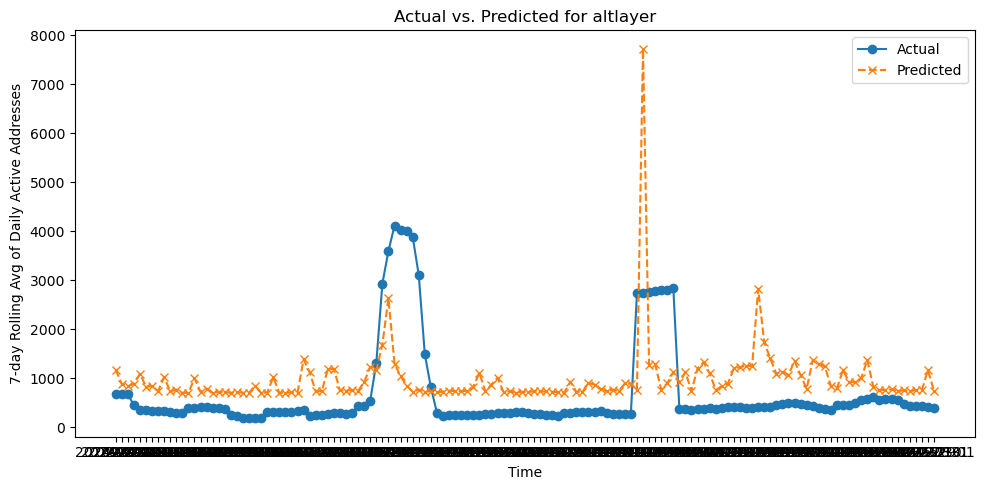

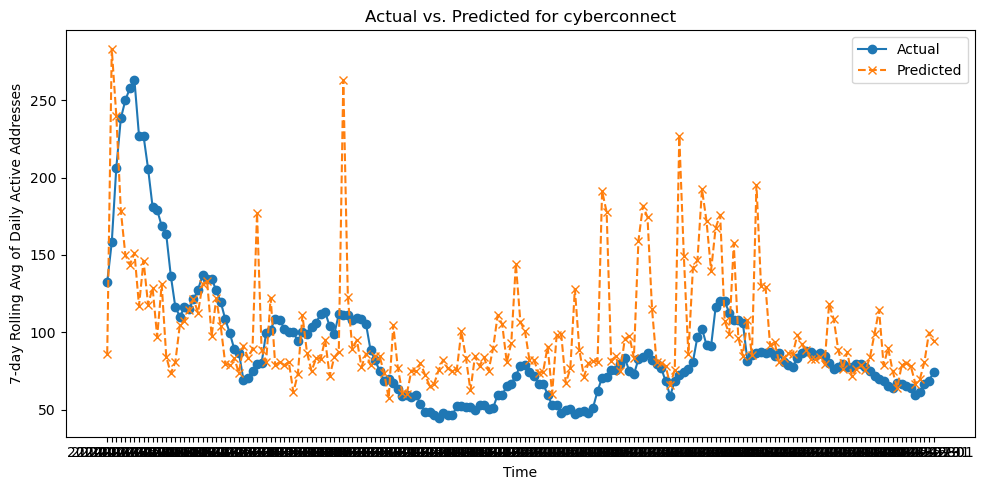

...

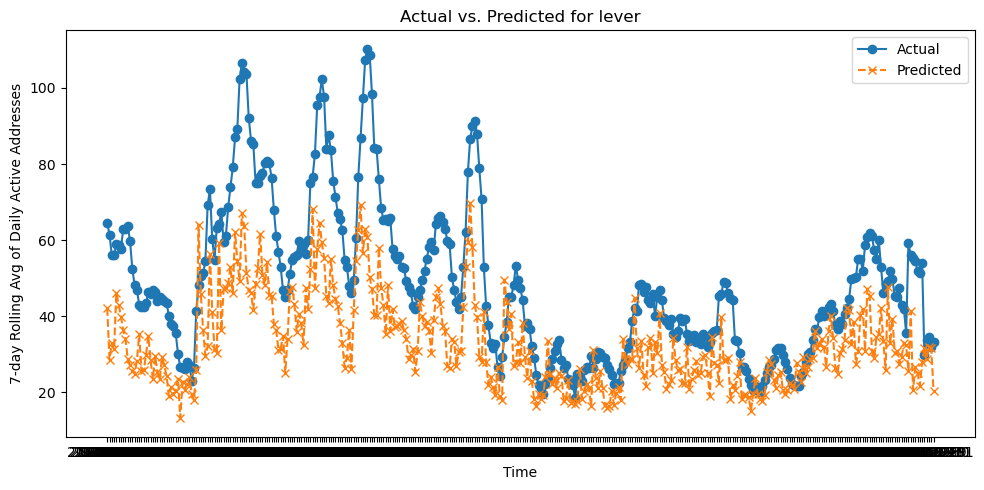

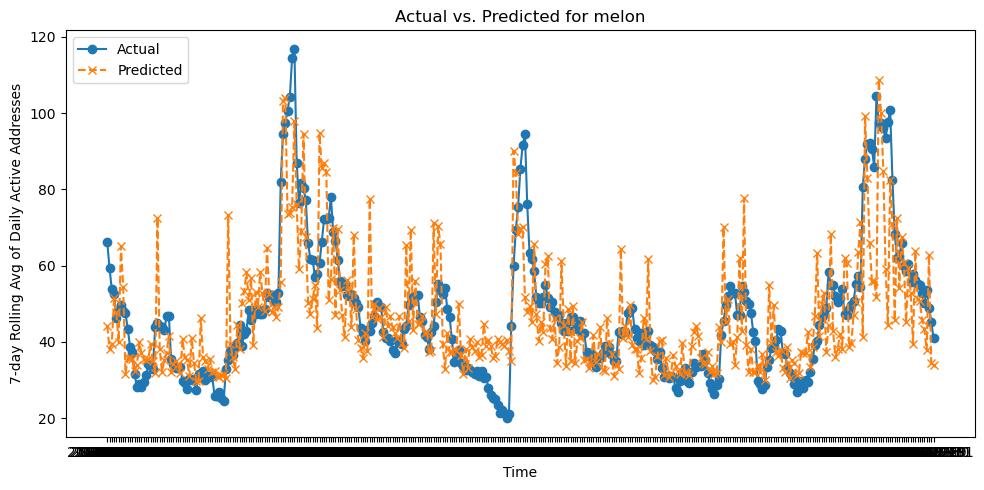

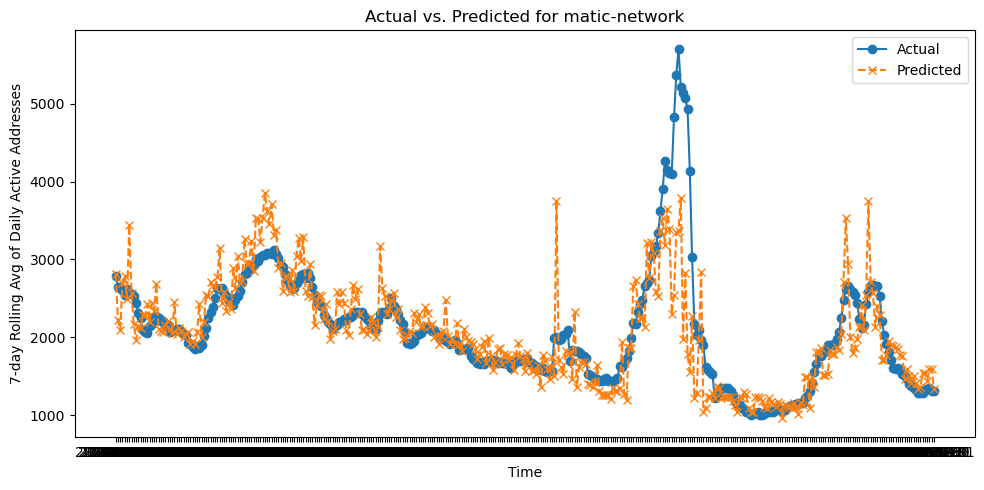

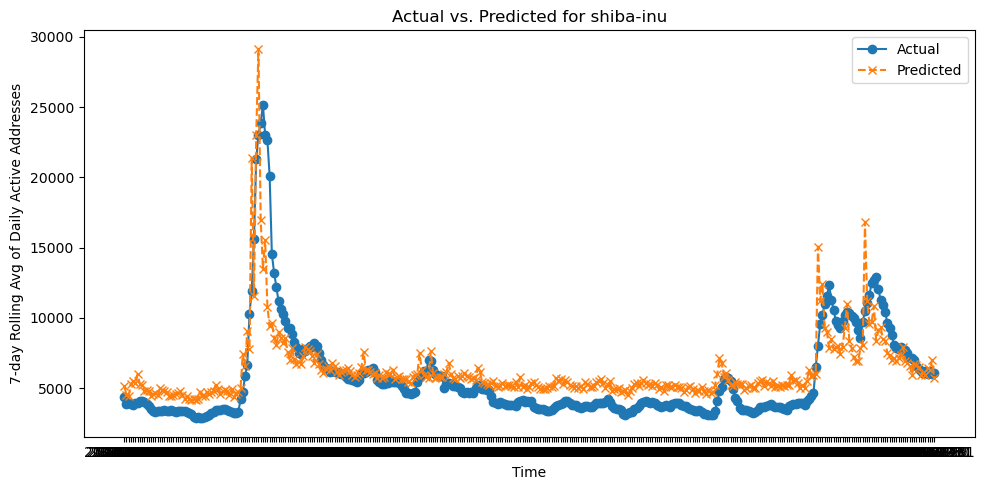

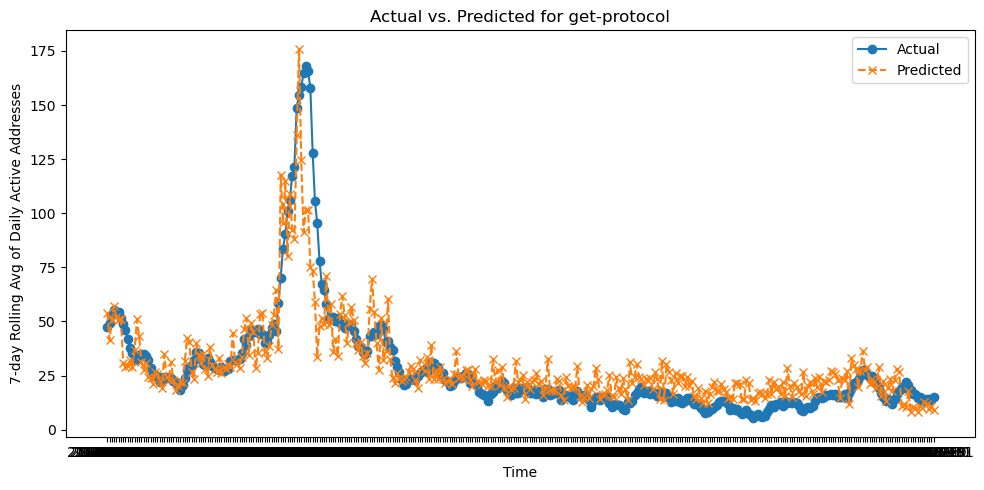

In [86]:
for token, pred_data in token_predictions.items():
    idx = pred_data['index']
    y_true = pred_data['y_test']
    y_pred = pred_data['y_pred']
    
    plt.figure(figsize=(10, 5))
    plt.plot(idx, y_true, label='Actual', marker='o')
    plt.plot(idx, y_pred, label='Predicted', linestyle='--', marker='x')
    plt.xlabel('Time')
    plt.ylabel('7-day Rolling Avg of Daily Active Addresses')
    plt.title(f'Actual vs. Predicted for {token}')
    plt.legend()
    plt.tight_layout()
    plt.show()

Below is the visualization of the performance of the initial CatBoost model for capturing market dynamics.

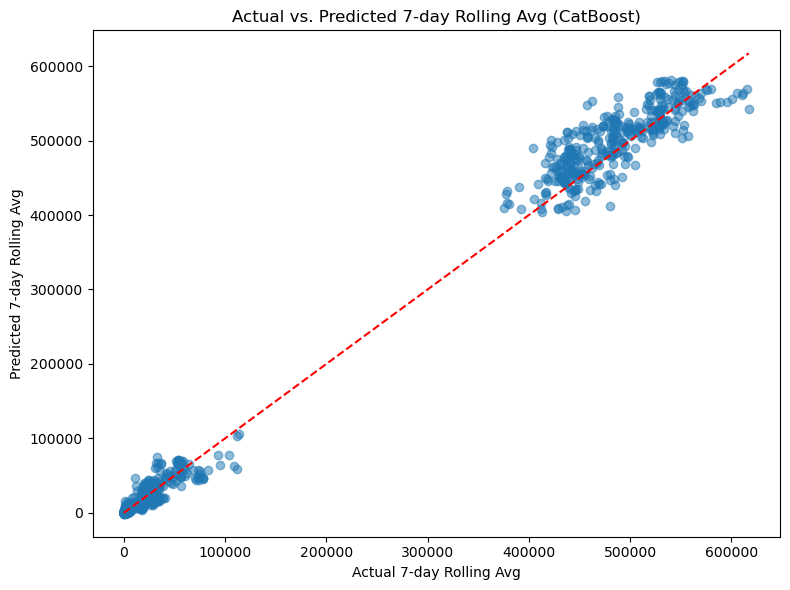

In [66]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_cb, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual 7-day Rolling Avg')
plt.ylabel('Predicted 7-day Rolling Avg')
plt.title('Actual vs. Predicted 7-day Rolling Avg (CatBoost)')
plt.tight_layout()
plt.show()

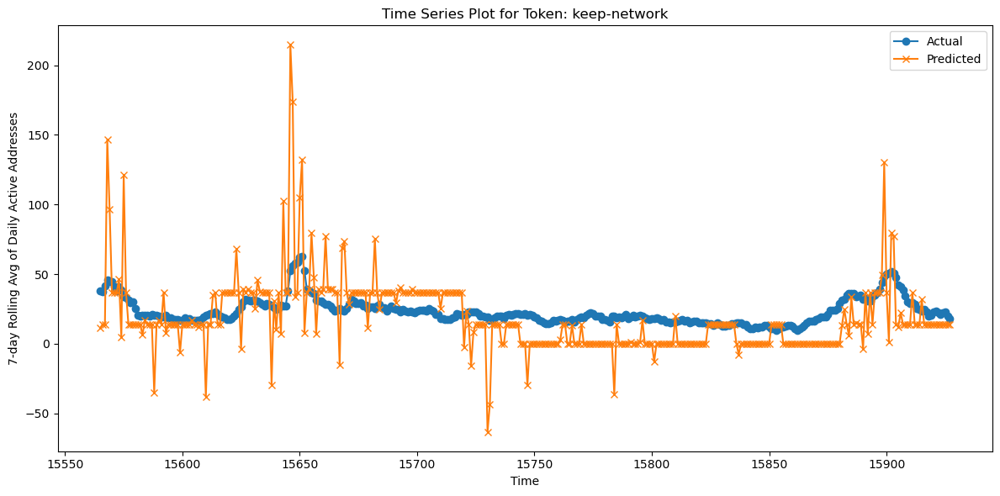

In [67]:
# Select the token with the most test samples
token_counts = test_df['token'].value_counts()
selected_token = token_counts.idxmax()
token_data = test_df[test_df['token'] == selected_token].copy()
token_data['prediction'] = best_cb_model.predict(token_data[features])

plt.figure(figsize=(12, 6))
plt.plot(token_data.index, token_data['target'], label='Actual', marker='o')
plt.plot(token_data.index, token_data['prediction'], label='Predicted', marker='x')
plt.xlabel('Time')
plt.ylabel('7-day Rolling Avg of Daily Active Addresses')
plt.title(f'Time Series Plot for Token: {selected_token}')
plt.legend()
plt.tight_layout()
plt.show()


Based on the aggregated results, token-specific CatBoost models show a wide range of performance. For example, tokens such as leisuremeta, chronotech, and wax exhibit low RMSE and MAE with high weighted directional accuracy (above 0.79, with leisuremeta reaching 0.88), indicating that both the magnitude and trend are captured reasonably well. In contrast, tokens like firmachain and niobium-coin have very low directional accuracy (around 0.16–0.24), even when the absolute errors are small, suggesting that trend direction is poorly predicted for these cases. Overall, models were successfully built for 87 out of 100 tokens, which demonstrates the feasibility of our approach. However, the performance variations point to issues such as inherent volatility, insufficient or noisy data, and possibly limited feature informativeness in some tokens. 

I would next explore deep learning approaches specifically designed for time series forecasting. One promising direction is using Neural Hierarchical Interpolation models like N-HiTS, which decompose the series into multiple temporal resolutions and capture both global and local trends—this is particularly useful for the volatile nature of on-chain metrics. I’d also investigate integrating Kalman filtering into the pipeline; as a recursive Bayesian estimator, Kalman filters can smooth noisy observations and provide robust short-term forecasts by optimally blending model predictions with actual measurements. Combining these state‑of‑the‑art techniques, possibly in a hybrid model framework that leverages both deep learning and traditional statistical methods, would likely improve both accuracy and trend directional prediction, especially when validated using rigorous time series cross-validation.

# Part B: Improvements and reasoning

#### I would integrate social signals into the model by extracting features from X and Telegram that capture public sentiment and engagement. I’d collect tweet volume mentioning a token, retweet and like counts, sentiment scores derived from NLP sentiment analysis models, and even trending topics or hashtags related to the token. On Telegram, metrics could include message frequency, channel or group growth rates, and sentiment analysis of the discussion. These features, when aggregated over appropriate time windows (e.g., daily or weekly), can be combined with on-chain data to enrich the feature set. I expect that positive or negative shifts in social sentiment and sudden spikes in engagement could serve as leading indicators of changes in on-chain activity, thus improving both the magnitude and the directional accuracy of the predictions.